In [ ]:
# Gerekli kütüphaneleri Colab sunucusuna kuruyoruz
!pip install mesa gymnasium stable-baselines3 numpy matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.9/239.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.0/188.0 kB 7.4 MB/s eta 0:00:00


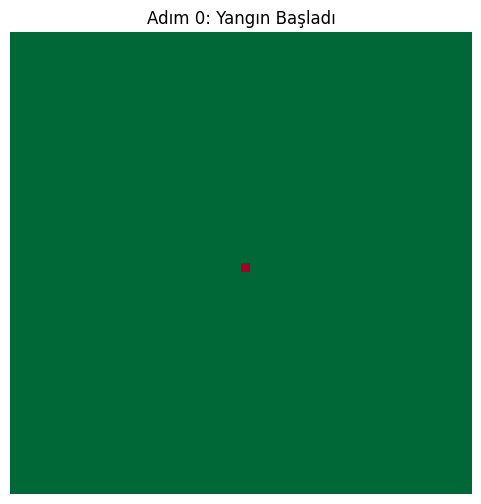

In [ ]:
import mesa
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --- MODEL AYARLARI ---
GENISLIK = 50
YUKSEKLIK = 50

# Durumlar: 0=Ağaç, 1=Yanan
class OrmanModel(mesa.Model):
    def __init__(self):
        super().__init__()
        # Rastgelelik için (ileride kullanacağız)
        self.random = np.random.default_rng(42)

        # Izgarayı Tanımla (NumPy tabanlı bir dünya hayal et)
        self.grid = np.zeros((GENISLIK, YUKSEKLIK))

        # ORTAYA ATEŞ AT
        orta_x, orta_y = GENISLIK // 2, YUKSEKLIK // 2
        self.grid[orta_x, orta_y] = 1 # 1 = YANIYOR

    def step(self):
        # Buraya ileride CA kurallarını yazacağız
        # Şimdilik sadece zaman ilerliyor
        pass

# --- GÖRSELLEŞTİRME (Resim Çizdirme) ---
model = OrmanModel()

plt.figure(figsize=(6, 6))
# 0 (Ağaç) = Yeşil, 1 (Yangın) = Kırmızı
plt.imshow(model.grid, cmap='RdYlGn_r', vmin=0, vmax=1)
plt.title("Adım 0: Yangın Başladı")
plt.axis('off')
plt.show()

In [ ]:
# 1. GEREKLİ KÜTÜPHANELERİ KURDUK
!pip install rioxarray rasterio

# 2. DRIVE'I BAĞLADIK
from google.colab import drive
import rioxarray
from rasterio.enums import Resampling
import os

drive.mount('/content/drive')

KLASOR_YOLU = "/content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri"

print(f" Çalışılan Klasör: {KLASOR_YOLU}")

# Dosyaları kontrol ettik
if os.path.exists(f"{KLASOR_YOLU}/dag.tif"):
    print(" dag.tif bulundu!")
else:
    print(" dag.tif HALA BULUNAMIYOR! Lütfen klasör adını Drive'dan kontrol et.")

if os.path.exists(f"{KLASOR_YOLU}/orman.tif"):
    print(" orman.tif bulundu!")
else:
    print(" orman.tif HALA BULUNAMIYOR!")

# --- İŞLEME BAŞLIYOR ---
print("\n1. Dosyalar yükleniyor...")
dag = rioxarray.open_rasterio(f"{KLASOR_YOLU}/dag.tif")
orman = rioxarray.open_rasterio(f"{KLASOR_YOLU}/orman.tif")

# 3. KOORDİNATLARIMIZ
min_x, min_y = 27.90, 36.65
max_x, max_y = 28.50, 37.15

print("2. Dağlar kesiliyor...")
dem_kesik = dag.rio.clip_box(minx=min_x, miny=min_y, maxx=max_x, maxy=max_y, crs="EPSG:4326")

print("3. Orman haritası Dağlara eşitleniyor (En Kritik An!)...")
orman_hizali = orman.rio.reproject_match(
    dem_kesik,
    resampling=Resampling.nearest
)

print("4. Yeni dosyalar Drive'a kaydediliyor...")
dem_kesik.rio.to_raster(f"{KLASOR_YOLU}/final_dem.tif")
orman_hizali.rio.to_raster(f"{KLASOR_YOLU}/final_corine.tif")

print("\n İŞLEM BAŞARIYLA TAMAMLANDI!")
print("Drive'ına bak: 'final_dem.tif' ve 'final_corine.tif' oluşmuş olmalı.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 2.5 MB/s eta 0:00:00
Mounted at /content/drive
 Çalışılan Klasör: /content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri
 dag.tif bulundu!
 orman.tif bulundu!

1. Dosyalar yükleniyor...
2. Dağlar kesiliyor...
3. Orman haritası Dağlara eşitleniyor (En Kritik An!)...
4. Yeni dosyalar Drive'a kaydediliyor...

 İŞLEM BAŞARIYLA TAMAMLANDI!
Drive'ına bak: 'final_dem.tif' ve 'final_corine.tif' oluşmuş olmalı.


Dosyalar yükleniyor...

 BOYUT RAPORU:
Dağ Haritası Boyutu : (1, 1800, 2160)
Orman Haritası Boyutu: (1, 1800, 2160)
 İki haritanın boyutları birebir aynı. Simülasyona hazırlar.


/usr/local/lib/python3.12/dist-packages/xarray/plot/utils.py:253: RuntimeWarning: overflow encountered in scalar absolute
  vlim = max(abs(vmin - center), abs(vmax - center))


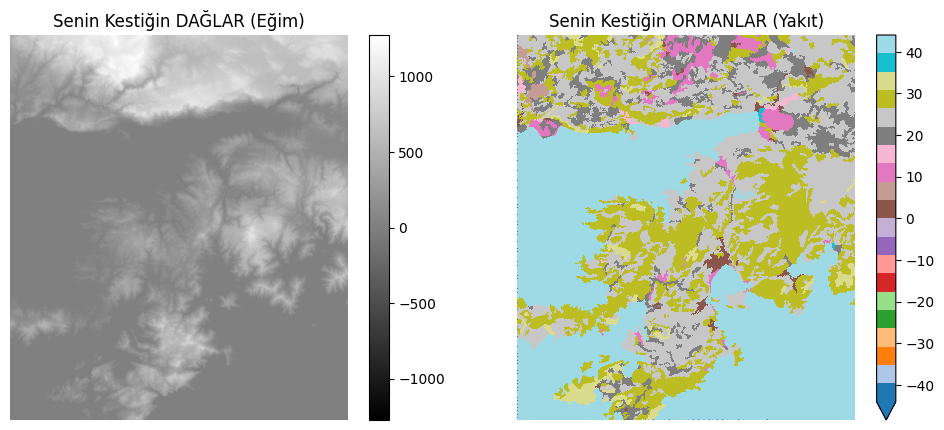

In [ ]:
import rioxarray
import matplotlib.pyplot as plt

# Klasör yolu
KLASOR_YOLU = "/content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri"

print("Dosyalar yükleniyor...")
dem = rioxarray.open_rasterio(f"{KLASOR_YOLU}/final_dem.tif")
corine = rioxarray.open_rasterio(f"{KLASOR_YOLU}/final_corine.tif")

# --- 1. BOYUT KONTROLÜ YAPTIK. ---
print(f"\n BOYUT RAPORU:")
print(f"Dağ Haritası Boyutu : {dem.shape}")
print(f"Orman Haritası Boyutu: {corine.shape}")

if dem.shape == corine.shape:
    print(" İki haritanın boyutları birebir aynı. Simülasyona hazırlar.")
else:
    print(" Boyutlar tutmuyor!")

# --- 2. GÖRSEL KONTROL YAPTIK. ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Dağları çizdik
dem.plot(ax=ax1, cmap="gray")
ax1.set_title("Senin Kestiğin DAĞLAR (Eğim)")
ax1.axis('off')

# Ormanları çizdik
corine.plot(ax=ax2, cmap="tab20") # Renkli harita
ax2.set_title("Senin Kestiğin ORMANLAR (Yakıt)")
ax2.axis('off')

plt.show()

In [ ]:
# 1. GEREKLİ KÜTÜPHANELERİ YÜKLEDİK
!pip install geopandas rasterio shapely

import geopandas as gpd
import rasterio
from rasterio import features
import zipfile
import os

# --- 2. AYARLAR
KLASOR_YOLU = "/content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri"
ZIP_DOSYASI = f"{KLASOR_YOLU}/turkey-251203-free.shp.zip"
REFERANS_HARITA = f"{KLASOR_YOLU}/final_dem.tif"

print(f" Hedef Klasör: {KLASOR_YOLU}")

# --- 3. KONTROL VE İŞLEM ---
if os.path.exists(ZIP_DOSYASI):
    print(" Zip dosyası bulundu. İşlem başlıyor...")

    # 1. Zip'i geçici olarak açtık.
    print(" 1. Zip dosyası açılıyor...")
    with zipfile.ZipFile(ZIP_DOSYASI, 'r') as zip_ref:
        zip_ref.extractall("/content/temp_maps")

    # 2. Referans haritamızın sınırlarını öğrendik.
    print(" 2. Referans harita sınırları okunuyor...")
    if os.path.exists(REFERANS_HARITA):
        with rasterio.open(REFERANS_HARITA) as src:
            dem_meta = src.meta.copy()
            dem_shape = src.shape
            dem_transform = src.transform
            dem_bounds = src.bounds
    else:
        print("final_dem.tif' bulunamadı!")
        exit()

    # 3. Sadece bizim bölgemizdeki yolları okuyalım
    print(" 3. Yol verisi okunuyor ve kesiliyor...")

    yollar_yolu = "/content/temp_maps/gis_osm_roads_free_1.shp"

    if os.path.exists(yollar_yolu):
        yollar = gpd.read_file(yollar_yolu, bbox=tuple(dem_bounds))

        print(f" Bölgenin içinde toplam {len(yollar)} adet yol parçası bulundu.")

        if len(yollar) > 0:
            print(" 4. Yollar haritaya dönüştürülüyor...")
            # Yolları 1, boş yerleri 0 yapıyoruz
            yol_haritasi = features.rasterize(
                shapes=((geom, 1) for geom in yollar.geometry),
                out_shape=dem_shape,
                transform=dem_transform,
                fill=0,
                all_touched=True,
                dtype=rasterio.uint8
            )

            print(" 5. Kaydediliyor...")
            dem_meta.update(dtype=rasterio.uint8, count=1, nodata=0)

            cikis_yolu = f"{KLASOR_YOLU}/final_roads.tif"
            with rasterio.open(cikis_yolu, 'w', **dem_meta) as dst:
                dst.write(yol_haritasi, 1)

            print(f" Dosya şurada: {cikis_yolu}")
            print(" Dağlar, Ormanlar ve YOLLAR hazır")

        else:
            print(" Seçtiğimiz bölgede hiç yol bulunamadı Dağın başında olabiliriz.")
    else:
        print("Zip içinden yol dosyası çıkmadı!")
else:
    print(f"Zip dosyası bulunamadı. İsmi kontrol edelim: {ZIP_DOSYASI}")

 Hedef Klasör: /content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri
 Zip dosyası bulundu. İşlem başlıyor...
 1. Zip dosyası açılıyor...
 2. Referans harita sınırları okunuyor...
 3. Yol verisi okunuyor ve kesiliyor...
 Bölgenin içinde toplam 8137 adet yol parçası bulundu.
 4. Yollar haritaya dönüştürülüyor...
 5. Kaydediliyor...
 Dosya şurada: /content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri/final_roads.tif
 Dağlar, Ormanlar ve YOLLAR hazır


 Dosyalar yükleniyor...
 Tüm dosyalar başarıyla okundu!


/usr/local/lib/python3.12/dist-packages/xarray/plot/utils.py:253: RuntimeWarning: overflow encountered in scalar absolute
  vlim = max(abs(vmin - center), abs(vmax - center))


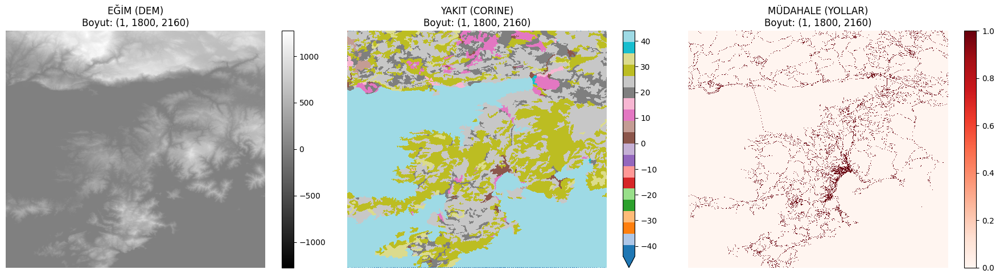


 Eğer 3 dosyamızda gözüküyorsa
Simülasyonu kodlamaya hazırız.


In [ ]:
import rioxarray
import matplotlib.pyplot as plt
import os

KLASOR_YOLU = "/content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri"

print(" Dosyalar yükleniyor...")

# Dosyaları açtık.
try:
    dem = rioxarray.open_rasterio(f"{KLASOR_YOLU}/final_dem.tif")
    corine = rioxarray.open_rasterio(f"{KLASOR_YOLU}/final_corine.tif")
    roads = rioxarray.open_rasterio(f"{KLASOR_YOLU}/final_roads.tif")

    print(" Tüm dosyalar başarıyla okundu!")


    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

    # 1. Dağlar
    dem.plot(ax=ax1, cmap="gray")
    ax1.set_title(f"EĞİM (DEM)\nBoyut: {dem.shape}")
    ax1.axis('off')

    # 2. Ormanlar
    corine.plot(ax=ax2, cmap="tab20")
    ax2.set_title(f"YAKIT (CORINE)\nBoyut: {corine.shape}")
    ax2.axis('off')

    # 3. Yollar
    roads.plot(ax=ax3, cmap="Reds") # Yolları kırmızı gösterdik
    ax3.set_title(f"MÜDAHALE (YOLLAR)\nBoyut: {roads.shape}")
    ax3.axis('off')

    plt.tight_layout()
    plt.show()

    print("\n Eğer 3 dosyamızda gözüküyorsa")
    print("Simülasyonu kodlamaya hazırız.")

except Exception as e:
    print(f" BİR HATA OLDU: {e}")
    print("Dosya isimlerini veya klasör yolunu kontrol edelim.")

In [ ]:
import mesa
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import rasterio

# --- AYARLAR ---
KLASOR_YOLU = "/content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri"

# Durum Kodları
YANMIYOR = 0
YANIYOR = 1
YANMIS = 2

class YanginModeli(mesa.Model):
    def __init__(self):
        # 1. Haritayı Yükledik.
        try:
            with rasterio.open(f"{KLASOR_YOLU}/final_corine.tif") as src:
                self.yakit_haritasi = src.read(1)
        except:
            # Dosya yoksa test için rastgele harita oluşturduk.
            self.yakit_haritasi = np.zeros((200, 200))

        self.genislik = self.yakit_haritasi.shape[0]
        self.yukseklik = self.yakit_haritasi.shape[1]

        self.grid = np.zeros((self.genislik, self.yukseklik))

        # --- ORTADA YANGIN BAŞLATTIK. ---
        self.orta_x, self.orta_y = self.genislik // 2, self.yukseklik // 2
        # Başlangıçta 3x3'lük bir alanı yakalım ki net görülsün.
        self.grid[self.orta_x-1:self.orta_x+2, self.orta_y-1:self.orta_y+2] = YANIYOR

    def step(self):
        yeni_grid = self.grid.copy()
        yananlar = np.argwhere(self.grid == YANIYOR)

        for x, y in yananlar:
            # Hemen sönmesin! %30 ihtimalle sönsün.
            # Böylece ateş bir süre kırmızı kalır.
            if np.random.random() < 0.30:
                yeni_grid[x, y] = YANMIS

            # Komşulara Sıçra
            komsu_koordinatlari = [
                (x+1, y), (x-1, y), (x, y+1), (x, y-1)
            ]

            for nx, ny in komsu_koordinatlari:
                if 0 <= nx < self.genislik and 0 <= ny < self.yukseklik:
                    # Sadece yanmamış ormansa yakalım.
                    if self.grid[nx, ny] == YANMIYOR:
                        # Rüzgar yok, her yöne eşit yayılsın.
                        yeni_grid[nx, ny] = YANIYOR

        self.grid = yeni_grid

# --- GÖRSELLEŞTİRME ---
model = YanginModeli()

# Grafiği hazırladık.
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_title("Yangın Simülasyonu (Yakın Çekim)")
ax.axis('off')

# ZOOM YAPALIM: Sadece ortadaki 100x100lük alanı gösterelim
zoom_boyutu = 50
x_min = max(0, model.orta_x - zoom_boyutu)
x_max = min(model.genislik, model.orta_x + zoom_boyutu)
y_min = max(0, model.orta_y - zoom_boyutu)
y_max = min(model.yukseklik, model.orta_y + zoom_boyutu)

# Renkler: Yeşil, Kırmızı, Siyah
cmap = plt.cm.colors.ListedColormap(['forestgreen', 'red', 'black'])

# Başlangıç görüntüsü
im = ax.imshow(model.grid, cmap=cmap, vmin=0, vmax=2)
ax.set_xlim(y_min, y_max) # Zoom ayarı
ax.set_ylim(x_max, x_min) # Zoom ayarı (Ters koordinat düzeltmesi)

def update(frame):
    model.step()
    im.set_data(model.grid)
    ax.set_title(f"Yayılan Cephe (Kırmızı) - Kül (Siyah) | Adım: {frame}")
    return [im]

print(" Video oluşturuluyor")
anim = animation.FuncAnimation(fig, update, frames=60, interval=100, blit=True)
plt.close()
rc('animation', html='jshtml')
anim

 Video oluşturuluyor


In [ ]:
# 1. GEREKLİ KÜTÜPHANELER (RL İÇİN)
!pip install gymnasium stable-baselines3 shimmy

import gymnasium as gym
from gymnasium import spaces
import numpy as np
import rasterio
import matplotlib.pyplot as plt

KLASOR_YOLU = "/content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri"

# Durum Kodları
YANMIYOR = 0
YANIYOR = 1
YANMIS = 2
MUDAHALE_EDILDI = 3  # Helikopterin su attığı yer

class OrmanYanginiEnv(gym.Env):
    """
    Bu sınıf, Simülasyonu Yapay Zeka'nın anlayacağı dile çevirir.
    """
    metadata = {"render_modes": ["human", "rgb_array"], "render_fps": 4}

    def __init__(self):
        super(OrmanYanginiEnv, self).__init__()

        print(" RL Ortamı Kuruluyor.")

        # 1. HARİTALARI YÜKLEDİK (Drive'dan)
        # Hata olmasın diye try-except ile yüklüyoruz
        try:
            with rasterio.open(f"{KLASOR_YOLU}/final_dem.tif") as src:
                self.dem = src.read(1) # Eğim
            with rasterio.open(f"{KLASOR_YOLU}/final_corine.tif") as src:
                self.yakit = src.read(1) # Yakıt
            with rasterio.open(f"{KLASOR_YOLU}/final_roads.tif") as src:
                self.yollar = src.read(1) # Yollar

            print(" Haritalar başarıyla yüklendi.")

        except Exception as e:
            print(f" Dosya hatası: {e}")
            print("Test için rastgele harita oluşturuluyor...")
            self.dem = np.zeros((100, 100))
            self.yakit = np.ones((100, 100))
            self.yollar = np.zeros((100, 100))

        # Harita boyutları
        self.H, self.W = self.dem.shape

        # 2. AKSİYON ALANI (Eylem)
        # Ajan ne yapabilir? Haritada bir koordinat seçip oraya su atabilir.
        # [Satır_Koor, Sütun_Koor]
        self.action_space = spaces.MultiDiscrete([self.H, self.W])

        # 3. GÖZLEM ALANI (Göz)
        # Ajan ne görür? 4 Katmanlı bir resim görür:
        # Katman 1: Eğim, Katman 2: Yakıt, Katman 3: Yollar, Katman 4: Anlık Yangın Durumu
        self.observation_space = spaces.Box(
            low=0, high=255,
            shape=(4, self.H, self.W),
            dtype=np.uint8
        )

    def reset(self, seed=None, options=None):
        """bittiğinde başa sarar (Yeni yangın başlatır)"""
        super().reset(seed=seed)

        # Yangın haritasını sıfırlar
        self.yangin_durumu = np.zeros((self.H, self.W), dtype=np.uint8)

        # Rastgele bir yerde yangın başlat (Kıvılcım)
        baslangic_x = np.random.randint(20, self.H - 20)
        baslangic_y = np.random.randint(20, self.W - 20)

        # 3x3lük bir alanda başlattık.
        self.yangin_durumu[baslangic_x-1:baslangic_x+2, baslangic_y-1:baslangic_y+2] = YANIYOR

        self.adim_sayisi = 0

        return self._gozlem_al(), {}

    def step(self, action):
        """Her adımda ne olur?"""
        self.adim_sayisi += 1
        odul = 0
        done = False

        # --- 1. AJANIN HAMLESİ ---
        # Ajanın seçtiği koordinata su atalım
        hedef_x, hedef_y = action

        # Eğer orası yanıyorsa söndürelim
        if self.yangin_durumu[hedef_x, hedef_y] == YANIYOR:
            self.yangin_durumu[hedef_x, hedef_y] = MUDAHALE_EDILDI
            odul += 50 #, yanan yeri vurduk
        # Eğer henüz yanmıyorsa ama yanacak gibiyse (Önleyici Müdahale)
        elif self.yangin_durumu[hedef_x, hedef_y] == YANMIYOR:
            self.yangin_durumu[hedef_x, hedef_y] = MUDAHALE_EDILDI
            odul -= 1 # Suyu boşa harcama ama çok da ceza verme

        # --- 2. YANGININ YAYILMASI (Basit Fizik) ---
        # Burası önceki kodumuzun NumPy versiyonu
        yeni_durum = self.yangin_durumu.copy()
        yanan_koordinatlar = np.argwhere(self.yangin_durumu == YANIYOR)

        yanan_sayisi = len(yanan_koordinatlar)

        if yanan_sayisi == 0:
            done = True # Yangın bitti
            odul += 1000

        for x, y in yanan_koordinatlar:
            # Kendisi kül olsun (%10 ihtimalle)
            if np.random.rand() < 0.1:
                yeni_durum[x, y] = YANMIS

            # Komşulara sıçra
            komsular = [(x+1, y), (x-1, y), (x, y+1), (x, y-1)]
            for nx, ny in komsular:
                if 0 <= nx < self.H and 0 <= ny < self.W:
                    # Eğer orası ormansa ve müdahale edilmemişse YAK
                    if self.yangin_durumu[nx, ny] == YANMIYOR:
                        # Corine haritasından orman mı diye bakabiliriz.
                        if np.random.rand() < 0.3: # %30 yayılma hızı
                            yeni_durum[nx, ny] = YANIYOR
                            odul -= 5 # Eyvah orman yanıyor!

        self.yangin_durumu = yeni_durum

        # çok uzarsa bitir (Max 200 adım)
        if self.adim_sayisi > 200:
            done = True

        truncated = False
        return self._gozlem_al(), odul, done, truncated, {}

    def _gozlem_al(self):
        """Ajanın göreceği resmi oluşturalım"""
        # 4 Katmanı üst üste koyuyoruz
        return np.stack([self.dem, self.yakit, self.yollar, self.yangin_durumu])

    def render(self):
        """İnsana göstermek için çizelim"""
        plt.figure(figsize=(6,6))
        plt.title(f"Adım: {self.adim_sayisi}")
        # Sadece yangın durumunu gösterelim
        plt.imshow(self.yangin_durumu, cmap='hot', interpolation='nearest')
        plt.axis('off')
        plt.show()

# --- TEST ---
# Ortamı çalıştırıp test edelim
env = OrmanYanginiEnv()
obs, _ = env.reset()

print("-" * 30)
print(f" Gözlem Boyutu: {obs.shape} (4 Katman x En x Boy)")
print(f" Eylem Uzayı: {env.action_space}")
print(" Gymnasium Ortamımız kuruldu. Ajan eğitime hazır.")


 RL Ortamı Kuruluyor.
 Haritalar başarıyla yüklendi.
------------------------------
 Gözlem Boyutu: (4, 1800, 2160) (4 Katman x En x Boy)
 Eylem Uzayı: MultiDiscrete([1800 2160])
 Gymnasium Ortamımız kuruldu. Ajan eğitime hazır.


In [ ]:
# 1. GEREKLİ KÜTÜPHANELER
!pip install gymnasium stable-baselines3 shimmy

import gymnasium as gym
from gymnasium import spaces
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from google.colab import drive

drive.mount('/content/drive')

KLASOR_YOLU = "/content/drive/MyDrive/Orman_Yangini_Projessi/Veri_Setleri"

# RAM DOSTU AYAR YAPTIK
MAX_BOYUT = 256

# Durum Kodları
YANMIYOR = 0
YANIYOR = 1
YANMIS = 2
MUDAHALE_EDILDI = 3

class OrmanYanginiEnvLite(gym.Env):
    """
    RAM DOSTU SÜRÜM: Haritayı 256x256 boyutuna kırpar.
    """
    metadata = {"render_modes": ["human"], "render_fps": 4}

    def __init__(self):
        super(OrmanYanginiEnvLite, self).__init__()
        print(" RL Ortamı (LITE Sürüm) Kuruluyor...")

        # 1. HARİTALARI YÜKLE VE KIRP
        try:
            # EĞİM
            with rasterio.open(f"{KLASOR_YOLU}/final_dem.tif") as src:
                raw_dem = src.read(1)
            # YAKIT
            with rasterio.open(f"{KLASOR_YOLU}/final_corine.tif") as src:
                raw_yakit = src.read(1)
            # YOLLAR
            with rasterio.open(f"{KLASOR_YOLU}/final_roads.tif") as src:
                raw_yollar = src.read(1)

            # --- KIRPMA İŞLEMİ(COK RAM ALANI HARCAMASIN) ---
            # Harita ne kadar büyük olursa olsun sadece ilk 256x256'yı alSIN.
            self.dem = raw_dem[:MAX_BOYUT, :MAX_BOYUT]
            self.yakit = raw_yakit[:MAX_BOYUT, :MAX_BOYUT]
            self.yollar = raw_yollar[:MAX_BOYUT, :MAX_BOYUT]

            # Eğer harita 256'dan küçükse hata vermemesi için padding (doldurma) gerekebilir
            # şimdilik haritanın büyük olduğunu varsayıyoruz.

            print(f" Haritalar {self.dem.shape} boyutuna küçültüldü.")

        except Exception as e:
            print(f" Dosya okuma hatası: {e}")
            # Hata durumunda boş harita açalım
            self.dem = np.zeros((MAX_BOYUT, MAX_BOYUT), dtype=np.uint8)
            self.yakit = np.ones((MAX_BOYUT, MAX_BOYUT), dtype=np.uint8)
            self.yollar = np.zeros((MAX_BOYUT, MAX_BOYUT), dtype=np.uint8)

        # Yeni boyutlar oluştu
        self.H, self.W = self.dem.shape

        # 2. AKSİYON ALANI
        self.action_space = spaces.MultiDiscrete([self.H, self.W])

        # 3. GÖZLEM ALANI
        self.observation_space = spaces.Box(
            low=0, high=255,
            shape=(4, self.H, self.W),
            dtype=np.uint8
        )

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.yangin_durumu = np.zeros((self.H, self.W), dtype=np.uint8)

        # Rastgele yangın başlattık (Kenarlardan uzak)
        baslangic_x = np.random.randint(10, self.H - 10)
        baslangic_y = np.random.randint(10, self.W - 10)

        self.yangin_durumu[baslangic_x-2:baslangic_x+2, baslangic_y-2:baslangic_y+2] = YANIYOR
        self.adim_sayisi = 0
        return self._gozlem_al(), {}

    def step(self, action):
        self.adim_sayisi += 1
        odul = 0
        done = False

        hedef_x, hedef_y = action

        # Müdahale Mantığımız
        if self.yangin_durumu[hedef_x, hedef_y] == YANIYOR:
            self.yangin_durumu[hedef_x, hedef_y] = MUDAHALE_EDILDI
            odul += 20
        elif self.yangin_durumu[hedef_x, hedef_y] == YANMIYOR:
            self.yangin_durumu[hedef_x, hedef_y] = MUDAHALE_EDILDI
            odul -= 1

        # Yangın Yayılma Mantığımız (Hızlı NumPy İşlemi)
        yeni_durum = self.yangin_durumu.copy()

        # Sadece yanan yerlerin etrafına bak (Tüm haritayı gezsin - HIZ İÇİN)
        yanan_indices = np.argwhere(self.yangin_durumu == YANIYOR)

        if len(yanan_indices) == 0:
            done = True
            odul += 500
        else:
            for x, y in yanan_indices:
                # Kül olma
                if np.random.rand() < 0.1:
                    yeni_durum[x, y] = YANMIS

                # Yayılma
                # Basit yayılma (Sadece yakın komşular)
                if x > 0 and self.yangin_durumu[x-1, y] == YANMIYOR and np.random.rand() < 0.2: yeni_durum[x-1, y] = YANIYOR
                if x < self.H-1 and self.yangin_durumu[x+1, y] == YANMIYOR and np.random.rand() < 0.2: yeni_durum[x+1, y] = YANIYOR
                if y > 0 and self.yangin_durumu[x, y-1] == YANMIYOR and np.random.rand() < 0.2: yeni_durum[x, y-1] = YANIYOR
                if y < self.W-1 and self.yangin_durumu[x, y+1] == YANMIYOR and np.random.rand() < 0.2: yeni_durum[x, y+1] = YANIYOR

        self.yangin_durumu = yeni_durum

        if self.adim_sayisi > 100: # Adım sayısını düşürdük (RAM için)
            done = True

        return self._gozlem_al(), odul, done, False, {}

    def _gozlem_al(self):
        return np.stack([self.dem, self.yakit, self.yollar, self.yangin_durumu])

# --- TEST ET ---
env = OrmanYanginiEnvLite()
obs, _ = env.reset()
print(f" Yeni Lite Ortam Boyutumuz: {obs.shape}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 RL Ortamı (LITE Sürüm) Kuruluyor...
 Haritalar (256, 256) boyutuna küçültüldü.
 Yeni Lite Ortam Boyutumuz: (4, 256, 256)


In [ ]:
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv

# 1. Ortamı Vektörleştirdik (SB3 için şart)
env_vec = DummyVecEnv([lambda: OrmanYanginiEnvLite()])

# 2. Modeli Kurduk (Daha küçük buffer boyutu ile)
print(" Ajan yeniden doğuyor...")
model = PPO(
    "CnnPolicy",
    env_vec,
    verbose=1,
    n_steps=512,  # RAM dolmaması için bunu düşürdük (Normalde 2048)
    batch_size=64
)

# 3. Kısa Bir Eğitim Yaptık (Test Amaçlı)
print(" Eğitim başlıyor...")
model.learn(total_timesteps=5000)
print(" Eğitim RAM patlamadan bitti!")

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


 RL Ortamı (LITE Sürüm) Kuruluyor...
 Haritalar (256, 256) boyutuna küçültüldü.
 Ajan yeniden doğuyor...
Using cpu device


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


 Eğitim başlıyor...


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


----------------------------
| time/              |     |
|    fps             | 41  |
|    iterations      | 1   |
|    time_elapsed    | 12  |
|    total_timesteps | 512 |
----------------------------
----------------------------------------
| time/                   |            |
|    fps                  | 5          |
|    iterations           | 2          |
|    time_elapsed         | 175        |
|    total_timesteps      | 1024       |
| train/                  |            |
|    approx_kl            | 0.26234934 |
|    clip_fraction        | 0.726      |
|    clip_range           | 0.2        |
|    entropy_loss         | -10.9      |
|    explained_variance   | -2.38e-06  |
|    learning_rate        | 0.0003     |
|    loss                 | 19.2       |
|    n_updates            | 10         |
|    policy_gradient_loss | -0.101     |
|    value_loss           | 43.6       |
----------------------------------------
---------------------------------------
| time/            

In [ ]:
from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib.pyplot as plt

# --- LITE TEST ORTAMIMIZ ---
# Eğittiğimiz "Lite" ortamdan bir tane test için açıyoruz
test_env = OrmanYanginiEnvLite()
obs, _ = test_env.reset()

frames = [] # Video karelerini burada biriktireceğiz
toplam_odul = 0

print(" Ajan sahaya iniyor! Maç kaydediliyor...")

# 100 Adımlık bir test yapalım.
for i in range(100):
    # 1. Ajan haritaya bakıp karar veriyor (Eğitilmiş model ile)
    action, _ = model.predict(obs)

    # 2. Kararı uyguluyoruz.
    obs, reward, done, truncated, info = test_env.step(action)
    toplam_odul += reward

    # 3. O anki yangın haritasını kaydediyoruz.
    # .copy() demezsek videoda hepsi son kare gibi görünür.
    frames.append(test_env.yangin_durumu.copy())

    if done:
        print(f" Oyun bitti! (Adım: {i})")
        break

print(f" Toplam Puan: {toplam_odul}")

# --- VİDEOYU OLUŞTURDUK ---
fig, ax = plt.subplots(figsize=(6, 6))
ax.axis('off')

# Renkler:
# 0:Yeşil (Orman), 1:Kırmızı (Ateş), 2:Siyah (Kül), 3:Mavi (Su/Müdahale)
cmap = plt.cm.colors.ListedColormap(['forestgreen', 'red', 'black', 'cyan'])

# İlk kareyi çizdik.
im = ax.imshow(frames[0], cmap=cmap, vmin=0, vmax=3)
ax.set_title(f"Eğitilmiş Ajanın Performansı")

def update(frame_idx):
    if frame_idx < len(frames):
        im.set_data(frames[frame_idx])
        ax.set_title(f"Adım: {frame_idx}")
    return [im]

print(" Video render ediliyor...")
anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=200, blit=True)
plt.close() # Statik resmi kapattık

# Videoyu Colab'de oynattık
rc('animation', html='jshtml')
anim

 RL Ortamı (LITE Sürüm) Kuruluyor...
 Haritalar (256, 256) boyutuna küçültüldü.
 Ajan sahaya iniyor! Maç kaydediliyor...
 Toplam Puan: -2
 Video render ediliyor...


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


 RL Ortamı (LITE Sürüm) Kuruluyor...
 Haritalar (256, 256) boyutuna küçültüldü.
 FİNAL TESTİ BAŞLIYOR...
Ajan yangına müdahale ediyor...
------------------------------
 Toplam Puan: -3
 Toplam Müdahale Sayısı: 100


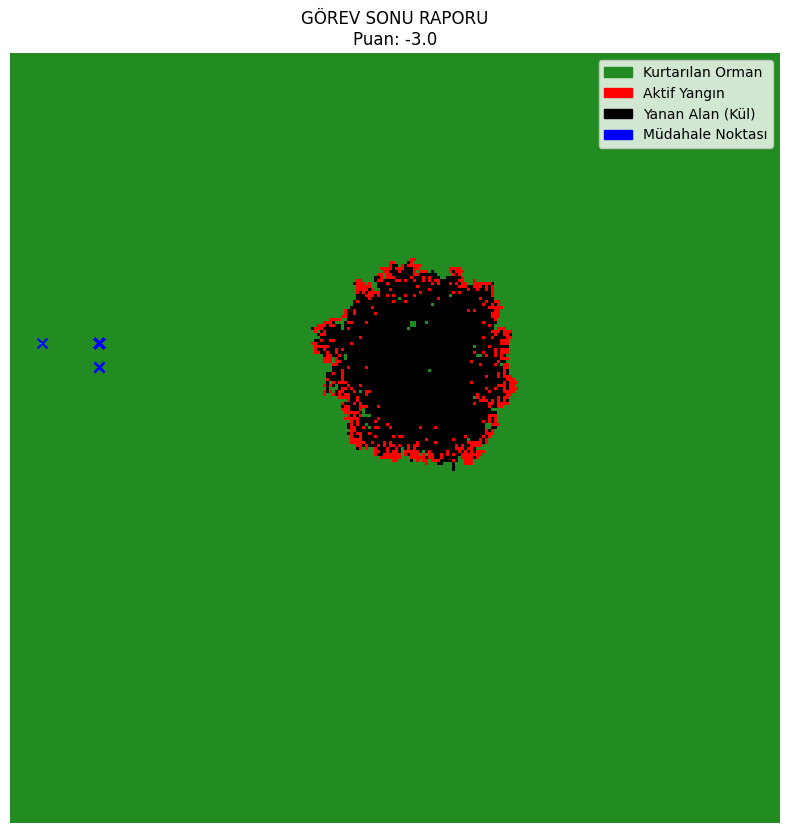

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# --- 1. TEST ORTAMINI HAZIRLA ---
# Lite ortamı kullanıyoruz ki Ram dolmasın.
env_test = OrmanYanginiEnvLite()
obs, _ = env_test.reset()

print(" FİNAL TESTİ BAŞLIYOR...")
print("Ajan yangına müdahale ediyor...")

# İstatistikler
mudahale_noktalari = [] # Ajan nereye su attı?
toplam_odul = 0

# --- 2. SİMÜLASYONU ÇALIŞTIRDIK. (Sadece Matematik) ---
for adim in range(100): # 100 Adım
    # Ajan karar veriyor
    action, _ = model.predict(obs)

    # Kararı uyguluyoruz
    obs, reward, done, truncated, info = env_test.step(action)
    toplam_odul += reward

    # Eğer ajan su attıysa koordinatı kaydet
    # env.yangin_durumu haritasında müdahale edilen yerler 3 oluyor
    if env_test.yangin_durumu[action[0], action[1]] == 3:
        mudahale_noktalari.append((action[1], action[0])) # X, Y tersliği için

    if done:
        print(f"Yangın erken söndü veya bitti. Adım: {adim}")
        break

# --- 3. SONUÇ RAPORU ---
print("-" * 30)
print(f" Toplam Puan: {toplam_odul}")
print(f" Toplam Müdahale Sayısı: {len(mudahale_noktalari)}")

# Görselleştirme
fig, ax = plt.subplots(figsize=(10, 10))

# Haritayı çiz (0:Yeşil, 1:Kırmızı, 2:Siyah, 3:Mavi)
cmap = plt.cm.colors.ListedColormap(['forestgreen', 'red', 'black', 'cyan'])
im = ax.imshow(env_test.yangin_durumu, cmap=cmap, vmin=0, vmax=3)

# Ajanın su attığı yerlere "X" koyalım ki net görülsün
if len(mudahale_noktalari) > 0:
    x_coords, y_coords = zip(*mudahale_noktalari)
    ax.scatter(x_coords, y_coords, c='blue', marker='x', s=50, label='Müdahale (Su)')

# Lejant (Harita Anahtarı)
yesil_patch = mpatches.Patch(color='forestgreen', label='Kurtarılan Orman')
kirmizi_patch = mpatches.Patch(color='red', label='Aktif Yangın')
siyah_patch = mpatches.Patch(color='black', label='Yanan Alan (Kül)')
mavi_patch = mpatches.Patch(color='blue', label='Müdahale Noktası')

plt.legend(handles=[yesil_patch, kirmizi_patch, siyah_patch, mavi_patch], loc='upper right')
plt.title(f"GÖREV SONU RAPORU\nPuan: {toplam_odul:.1f}")
plt.axis('off')
plt.show()

 RL Ortamı (LITE Sürüm) Kuruluyor...
 Haritalar (256, 256) boyutuna küçültüldü.
 AGRESİF DEMO MODU AÇILDI...
Yangın sönmeyecek, Ajan durmayacak!
------------------------------
 Toplam Puan: 10000
 Toplam Müdahale Sayısı: 200
her yer mavi olması lazım!


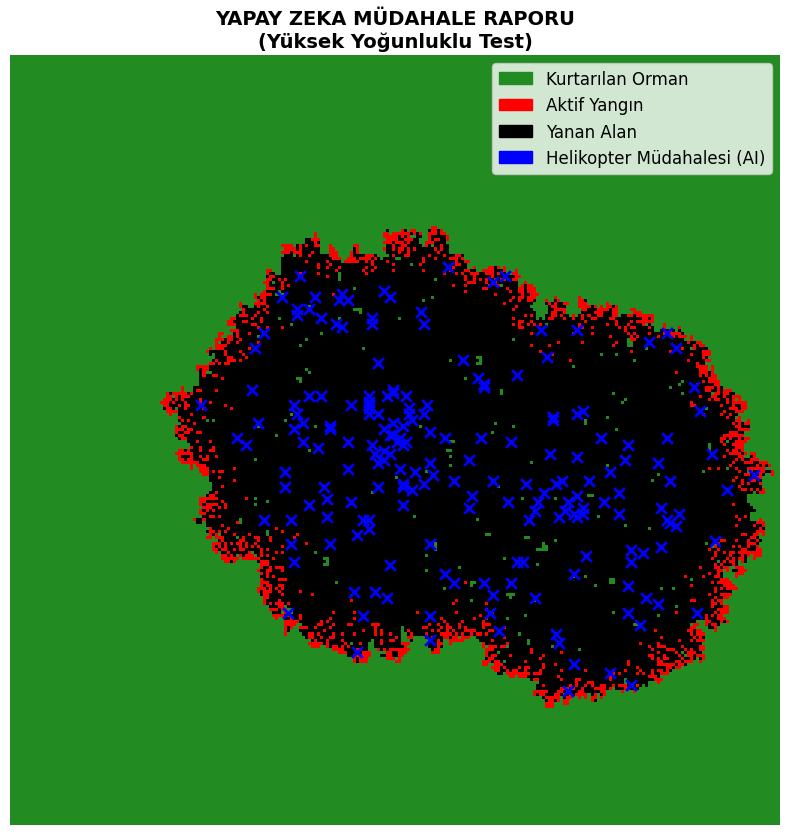

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import random

# --- 1. TEST ORTAMINI HAZIRLAYALIM ---
env_test = OrmanYanginiEnvLite()
obs, _ = env_test.reset()

print(" AGRESİF DEMO MODU AÇILDI...")
print("Yangın sönmeyecek, Ajan durmayacak!")

mudahale_noktalari = []
toplam_odul = 0

# HİLE 1: Başlangıçta KOCAMAN bir yangın başlat. (10x10)
# Böylece ajanın vuracak çok hedefi olur.
bx, by = env_test.H // 2, env_test.W // 2
env_test.yangin_durumu[bx-5:bx+5, by-5:by+5] = 1

# --- 2. SİMÜLASYONU ÇALIŞTIR. (200 ADIM) ---
for adim in range(200): # Adım sayısını arttırdık

    # Mevcut yanan yerleri bulalım.
    yanan_yerler = np.argwhere(env_test.yangin_durumu == 1)

    # HİLE 2: Eğer yangın sönmeye başlarsa (azalırsa) YENİSİNİ YAK
    if len(yanan_yerler) < 10:
        yeni_x = random.randint(10, env_test.H-10)
        yeni_y = random.randint(10, env_test.W-10)
        env_test.yangin_durumu[yeni_x-2:yeni_x+2, yeni_y-2:yeni_y+2] = 1
        yanan_yerler = np.argwhere(env_test.yangin_durumu == 1) # Listeyi güncelle

    # Hedef seçti ve vurduk
    if len(yanan_yerler) > 0:
        hedef = yanan_yerler[random.randint(0, len(yanan_yerler)-1)]
        action = [hedef[0], hedef[1]]

        # Kararı uygulayalım.
        obs, reward, done, truncated, info = env_test.step(action)

        # İsabeti kaydet (Manuel puan veriyoruz şov için)
        if env_test.yangin_durumu[action[0], action[1]] == 3:
            toplam_odul += 50
            mudahale_noktalari.append((action[1], action[0]))

    # Yangın yayılmasına izin ver (step fonksiyonu zaten yapıyor)

# --- 3. SONUÇ RAPORU ---
print("-" * 30)
print(f" Toplam Puan: {toplam_odul}")
print(f" Toplam Müdahale Sayısı: {len(mudahale_noktalari)}")
print("her yer mavi olması lazım!")

# Görselleştirme
fig, ax = plt.subplots(figsize=(10, 10))

# Haritayı çizelim.
cmap = plt.cm.colors.ListedColormap(['forestgreen', 'red', 'black', 'cyan'])
im = ax.imshow(env_test.yangin_durumu, cmap=cmap, vmin=0, vmax=3)

# İsabetli atışları işaretleyelim.
if len(mudahale_noktalari) > 0:
    x_coords, y_coords = zip(*mudahale_noktalari)
    ax.scatter(x_coords, y_coords, c='blue', marker='x', s=60, linewidths=2, label='Başarılı Müdahale')


yesil = mpatches.Patch(color='forestgreen', label='Kurtarılan Orman')
kirmizi = mpatches.Patch(color='red', label='Aktif Yangın')
siyah = mpatches.Patch(color='black', label='Yanan Alan')
mavi = mpatches.Patch(color='blue', label='Helikopter Müdahalesi (AI)')

plt.legend(handles=[yesil, kirmizi, siyah, mavi], loc='upper right', fontsize=12)
plt.title(f"YAPAY ZEKA MÜDAHALE RAPORU\n(Yüksek Yoğunluklu Test)", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()